# Invesco QQQ Trust (QQQ) vs SPDR ETF Trust (SPY)

An Exploratory Data Analysis project to compare QQQ vs SPY

## Introduction 

In this article we are going to analyze historical prices of Invesco QQQ Trust (QQQ) and SPDR ETF Trust (SPY) are try to find some useful insides using Exploratory Data Analysis (EDA).

*Disclaimer: The purpose of this article is only to demonstrate the EDA techniques with comparative analysis of QQQ & SPY, This is not the investment advice.*


### What is EDA?

Exploratory Data Analysis (EDA) is the process of exploring, investigating and gathering insights from data using statistical measures and visualizations. The objective of EDA is to develop and understanding of data, by uncovering trends, relationships and patterns.

EDA is both a science and an art. On the one hand it requires the knowledge of statistics, visualization techniques and data analysis tools like Numpy, Pandas, Seaborn etc. On the other hand, it requires asking interesting questions to guide the investigation and interpreting numbers & figures to generate useful insights.


### How to run the code
You can execute the code using **"Google Colab"** or **"Run Locally"** 

The code is available on Github: https://github.com/vinodvidhole/QQQ_vs_SPY_eda_project/blob/main/QQQ-vs-SPY-eda.ipynb

**Setup and Tools**

<u>Run on Colab :</u> 
    You will need to provide the Google login to run this notebook on Colab.<br>
<u>Run Locally :</u> Download and install [Anaconda](https://www.anaconda.com/) framework, We will be using Jupyter Notebook for writing & executing code.


### Outline of Project

Here is the outline of the project
- Import and Install the required libraries
- Download real-world dataset
- Perform data Preprocessing & cleaning
- Perform Exploratory analysis & Visualization
- Ask and answer Interesting questions about the data
- Summarize your inferences & write a conclusion

## Import and Install the required libraries

Fist step is to to install & Import required Python Libraries 

In [7]:
!pip install numpy pandas matplotlib seaborn plotly --quiet
!pip install yahoofinancials --quiet

In [8]:
from datetime import datetime, timedelta
import numpy as np 
import pandas as pd
from yahoofinancials import YahooFinancials

## Download real-world dataset

We are going to use historical data available in [Yahoo! Finance](https://finance.yahoo.com/). Following 2 url's will point us to the required dataset.

**Invesco QQQ Trust (QQQ) :** https://finance.yahoo.com/quote/QQQ/history?period1=921024000&period2=1662768000&interval=1d&filter=history&frequency=1d&includeAdjustedClose=true

**SPDR SPY ETF Trust (SPY) :** https://finance.yahoo.com/quote/SPY/history?period1=728265600&period2=1662768000&interval=1d&filter=history&frequency=1d&includeAdjustedClose=true


You can use web scraping techniques shown [here](https://blog.jovian.ai/web-scraping-yahoo-finance-using-python-7c4612fab70c) to download this data. But in this tutorial we are using Pyhom module [yahoofinancials](https://pypi.org/project/yahoofinancials/) to get data into the pandas dataframe. 

Let's create a helper function to download data into Pandas Data Frame

In [9]:
def get_yahoofin_dataframe(ticker, start_date, end_date, frequency):
    '''This function will return Historical pricing data in the form of Pandas DataFrame'''
    yahoo_financials = YahooFinancials(ticker)
    stock_prices = yahoo_financials.get_historical_price_data(start_date, end_date, frequency)
    return pd.DataFrame(stock_prices[ticker]['prices'])

In [10]:
#Variable initialization
start_date = '1999-03-09'
end_date = datetime.now().strftime('%Y-%m-%d')
QQQ_ticker = 'QQQ'
SPY_ticker = 'SPY'
print('Start Date    :{} \nEnd Date      :{}\nQQQ Ticker   :{}\nSPY Ticker:{}'.format(start_date, end_date,QQQ_ticker, SPY_ticker))

Start Date    :1999-03-09 
End Date      :2022-09-10
QQQ Ticker   :QQQ
SPY Ticker:SPY


Let's begin by downloading the data, we will call the helper function for QQQ & SPY

In [11]:
QQQ_df = get_yahoofin_dataframe(QQQ_ticker, start_date, end_date, 'daily')
QQQ_df.head()

,date,high,low,open,close,volume,adjclose,formatted_date
0,921076200,51.156250,50.28125,51.12500,51.0625,5232000,44.090473,1999-03-10
1,921162600,51.734375,50.31250,51.43750,51.3125,9688600,44.306332,1999-03-11
2,921249000,51.156250,49.65625,51.12500,50.0625,8743600,43.227009,1999-03-12
3,921508200,51.562500,49.90625,50.43750,51.5000,6369000,44.468216,1999-03-15
4,921594600,52.156250,51.15625,51.71875,51.9375,4905800,44.846004,1999-03-16


In [12]:
SPY_df = get_yahoofin_dataframe(SPY_ticker, start_date, end_date, 'daily')
SPY_df.head()

,date,high,low,open,close,volume,adjclose,formatted_date
0,920989800,129.93750,127.75000,128.12500,128.06250,7893400,83.753189,1999-03-09
1,921076200,129.25000,127.78125,128.46875,129.18750,3950000,84.488930,1999-03-10
2,921162600,131.18750,128.87500,129.68750,130.62500,6583700,85.429070,1999-03-11
3,921249000,131.03125,129.21875,131.00000,129.37500,5286500,84.611572,1999-03-12
4,921508200,131.25000,129.50000,129.93750,131.21875,5394400,85.817383,1999-03-15


In [13]:
print(QQQ_df.shape)
print(SPY_df.shape)

(5916, 8)
(5917, 8)


The dataset has been downloaded into Pandas DataFrame `SPY_df` & `QQQ_df`, Both the dataset has 8 columns and around 5.9 K rows each so total 11 K rows.  

## Perform data Preprocessing & cleaning

This is one of the most Important stage in the Data Science, real world data could be `Incomplete`, `Noisy` or `Inconsistent` and this could affect negatively in the further steps. 

### Remove unwanted Columns 

Most of the time Data set may contain the columns which may not be useful for the Analysis, in that case we should remove the unused columns. This would save the memory usage this would be handy when we deal with huge dataset of the size on GBs. 

We can get rid of `date` column from our dataset as we already have `formatted_date`

In [14]:
QQQ_df.drop('date',axis=1, inplace=True)
SPY_df.drop('date',axis=1, inplace=True)

### Transform the DataType

By default, Pandas uses large data types like int64 and float64 for numerical data and `object` for datetime. Depending on the situation we can use the smaller data types like int32, float32, int16 to save the memory. Also we should pars the date field to date time data type.

Lets check if there is any scope of data type modifications.

In [15]:
QQQ_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5916 entries, 0 to 5915
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   high            5916 non-null   float64
 1   low             5916 non-null   float64
 2   open            5916 non-null   float64
 3   close           5916 non-null   float64
 4   volume          5916 non-null   int64  
 5   adjclose        5916 non-null   float64
 6   formatted_date  5916 non-null   object 
dtypes: float64(5), int64(1), object(1)
memory usage: 323.7+ KB


formatted_date column represent the date but the date type is `object`, Lets convert this into the DateTime.

In [16]:
SPY_df.formatted_date = pd.to_datetime(SPY_df.formatted_date)
QQQ_df.formatted_date = pd.to_datetime(QQQ_df.formatted_date)

In [17]:
print('Data Type of formatted_date : ',type(SPY_df.formatted_date[0]))

Data Type of formatted_date :  <class 'pandas._libs.tslibs.timestamps.Timestamp'>


### Handle Missing Values

There are several techniques to handle missing data, choosing the right one is of most important. The choice of technique to deal with missing data depends on the problem statement & context of the data.

Lets check if we have any missing values.

In [18]:
SPY_df.isnull().sum()

high              0
low               0
open              0
close             0
volume            0
adjclose          0
formatted_date    0
dtype: int64

SPY Dataset doesn't have any missing values. 

In [19]:
QQQ_df.isnull().sum()

high              0
low               0
open              0
close             0
volume            0
adjclose          0
formatted_date    0
dtype: int64

QQQ Dataset doesn't have any missing values.

### Duplicate data 

If required, duplicate rows can be removed using the `pd.drop_duplicates` method. But this should be done carefully sometimes duplicate data mighe be a valid data (e.g. Runs Scored in any game)

In [21]:
SPY_df.duplicated().sum()
QQQ_df.duplicated().sum()

0

Our Dataset doesn't gave any duplicates.

### Set Proper Index 

This may or may not be applicable in all the cases, I am setting `formatted_date` as Index of the DataFrame. 

In [22]:
SPY_df.set_index('formatted_date', inplace=True)
QQQ_df.set_index('formatted_date', inplace=True)
SPY_df.sort_index(inplace=True)
QQQ_df.sort_index(inplace=True)

### Create additional Required Columns 

This may or may not be applicable in all the cases, In Our analysis for identification purpose I am creating a new column `asset_class` in both Data Frame. This would be useful when we concatenate both the Data frames.  

In [23]:
SPY_df['asset_class'] = 'SPY'
QQQ_df['asset_class'] = 'QQQ'

Computing `year` , `month` etc. from `formatted_date` (Index Column) and adding it as separate column.

In [24]:
SPY_df['year'] = SPY_df.index.year
QQQ_df['year'] = QQQ_df.index.year

SPY_df['month'] = SPY_df.index.month
QQQ_df['month'] = QQQ_df.index.month

SPY_df['year_month'] = SPY_df.year.map(str) +'-'+ SPY_df.month.map(str)
QQQ_df['year_month'] = QQQ_df.year.map(str) +'-'+ QQQ_df.month.map(str)

This is how the final data will look like.

In [25]:
SPY_df.sample(5)

,high,low,open,close,volume,adjclose,asset_class,year,month,year_month
formatted_date,,,,,,,,,,
2006-02-27,130.039993,129.279999,129.399994,129.460007,35858600,93.780281,SPY,2006,2,2006-2
2007-12-31,147.610001,146.059998,147.100006,146.210007,108126800,109.863113,SPY,2007,12,2007-12
2009-05-12,91.830002,89.849998,91.629997,90.970001,282431300,70.501755,SPY,2009,5,2009-5
2011-04-11,133.449997,132.139999,133.000000,132.460007,121385400,106.795738,SPY,2011,4,2011-4
2019-11-26,314.279999,313.059998,313.410004,314.079987,37569000,300.541748,SPY,2019,11,2019-11


In [26]:
QQQ_df.sample(5)

,high,low,open,close,volume,adjclose,asset_class,year,month,year_month
formatted_date,,,,,,,,,,
2017-06-30,138.669998,137.190002,137.979996,137.639999,68898300,132.967667,QQQ,2017,6,2017-6
2002-12-13,25.570000,25.010000,25.520000,25.040001,72647800,21.621058,QQQ,2002,12,2002-12
2009-07-24,39.369999,38.779999,38.930000,39.049999,109312300,34.602203,QQQ,2009,7,2009-7
2012-01-27,60.509998,60.060001,60.090000,60.400002,45532300,54.667233,QQQ,2012,1,2012-1
2013-06-17,73.400002,72.599998,72.849998,72.980003,32441900,67.031731,QQQ,2013,6,2013-6


Data Preprocessing and Cleaning is done, lets move ahead with next topic.

## Perform Exploratory analysis & Visualization

In this phase we will check each column and try to find some useful insides using Visualization. Let's begin by importing`matplotlib.pyplot`, `seaborn` & `plotly.express`.

In [27]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import plotly.offline as py
%matplotlib inline

## Default settings
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (9, 5)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

### Analyze Closing Price 

Here first I am combining both 'SPY' & 'QQQ' data and then we will use line chart to study the trend of Historical closing price

In [28]:
all_df = pd.concat([SPY_df,QQQ_df])
all_df.sample(5)

,high,low,open,close,volume,adjclose,asset_class,year,month,year_month
formatted_date,,,,,,,,,,
2020-04-01,187.660004,180.860001,184.770004,182.309998,53715400,180.223572,QQQ,2020,4,2020-4
2019-12-16,320.149994,317.250000,319.220001,319.500000,82749700,305.728149,SPY,2019,12,2019-12
2003-07-02,30.990000,30.379999,30.410000,30.969999,81972500,26.741383,QQQ,2003,7,2003-7
2010-12-08,123.379997,122.410004,122.980003,123.279999,138019200,98.446716,SPY,2010,12,2010-12
2005-09-30,39.480000,39.130001,39.169998,39.459999,79248500,34.443745,QQQ,2005,9,2005-9


Lets plot the graph

In [30]:
fig = px.line(all_df,
              x=all_df.index,
              y=all_df.close,
              color=all_df.asset_class, 
              color_discrete_sequence=["violet", "yellow"],
              template = 'plotly_dark',
              title='Historical view of the closing price')

fig.update_layout(xaxis_title='Date', 
                  yaxis_title='Closing Price', 
                  legend_title='Asset Class')
fig.show()

By looking at `Closing Price` trend you can see that the price of `QQQ` & `SPY` has been increased in this century. Although there are some instances where prices are declining but overall prices has been increased as compared to start of this century. It would be interesting to check the time-line and corresponding events when there is price fall, we will cover it in next section. 

### Analyze Trade Volume 

Lets check `volume` field, what it has to offered. Here I am creating one more data frame `volume_df` This will provide us the monthly sum of the `volume` for QQQ & SPY. 

In [31]:
volume_df = all_df[['year_month','asset_class','volume']].groupby(by=['year_month','asset_class']).sum()
volume_df.reset_index(inplace=True);
volume_df.head(5)

,year_month,asset_class,volume
0,1999-10,QQQ,415435200
1,1999-10,SPY,196829400
2,1999-11,QQQ,366819200
3,1999-11,SPY,125042200
4,1999-12,QQQ,465355600


In [32]:
fig = px.area(volume_df, 
              facet_row = 'asset_class', 
              x = 'year_month', 
              y = 'volume', 
              color = 'asset_class', 
              template = 'plotly_dark',
              color_discrete_sequence=["yellow","blue"],
              labels={'asset_class':'Asset Class', }
            )

fig.update_layout(
    title="Volume QQQ vs SPY",
    legend_title="Asset Class",
  )

fig.update_yaxes(title_text="Volume")
fig.update_xaxes(title_text="Year & Month")
fig.show()

SPY is more popular than QQQ

Lets try to visualize them Individually.

In [33]:
QQQ_volume_df = volume_df[volume_df.asset_class == 'QQQ']
SPY_volume_df = volume_df[volume_df.asset_class == 'SPY']

In [34]:
figure1 = px.area(SPY_volume_df, 
              x = 'year_month', 
              y = 'volume', 
              color_discrete_sequence =['blue'],
             )

figure2 = px.area(QQQ_volume_df, 
              x = 'year_month', 
              y = 'volume',
              color_discrete_sequence =['yellow']
              )
          
fig = make_subplots(rows=2, cols=1,subplot_titles=("SPY","QQQ")) 

fig.append_trace(figure1["data"][0], row=1, col=1)
fig.append_trace(figure2["data"][0], row=2, col=1)

fig.update_yaxes(title_text="Volume (B)", row=1, col=1)
fig.update_yaxes(title_text="Volume", row=2, col=1)


fig.update_layout(title_text="Volume Trend")       
fig.show()

##TODO - Add Observation

### Analyze the distribution

Now lets try to find what is min and max values of various columns, Pandas provide a method `df.describe()` which provides descriptive statistics that summarize the central tendency, dispersion and shape of a dataset distribution. 

In [35]:
QQQ_df.describe()

,high,low,open,close,volume,adjclose,year,month
count,5916.000000,5916.000000,5916.000000,5916.000000,5.916000e+03,5916.000000,5916.000000,5916.000000
mean,101.559617,99.778062,100.723361,100.718190,6.744560e+07,95.579399,2010.439993,6.528229
std,88.669570,87.251510,88.008150,88.020351,5.058163e+07,89.037528,6.793410,3.401812
min,20.530001,19.760000,19.940001,20.059999,3.302000e+06,17.321024,1999.000000,1.000000
25%,41.737501,40.997500,41.382500,41.307501,3.012452e+07,36.101810,2005.000000,4.000000
50%,63.139219,61.799999,62.525625,62.449999,5.535055e+07,55.606876,2010.000000,7.000000
75%,118.145002,117.131250,117.677504,117.719999,9.087302e+07,112.704792,2016.000000,9.000000
max,408.709991,402.579987,405.570007,403.989990,6.167723e+08,402.208649,2022.000000,12.000000


In [36]:
SPY_df.describe()

,high,low,open,close,volume,adjclose,year,month
count,5917.000000,5917.000000,5917.000000,5917.000000,5.917000e+03,5917.000000,5917.000000,5917.000000
mean,184.028961,181.718824,182.932677,182.934322,1.059224e+08,156.549386,2010.438060,6.527632
std,93.269732,92.311393,92.819260,92.833979,9.469988e+07,101.319097,6.794463,3.401833
min,70.000000,67.099998,67.949997,68.110001,1.436600e+06,52.410133,1999.000000,1.000000
25%,119.660004,118.209999,119.010002,118.959999,4.688730e+07,86.202522,2005.000000,4.000000
50%,142.050003,140.360001,141.250000,141.190002,7.841540e+07,106.229446,2010.000000,7.000000
75%,218.529999,217.350006,218.000000,218.000000,1.393614e+08,196.059525,2016.000000,9.000000
max,479.980011,476.059998,479.220001,477.709991,8.710263e+08,474.182190,2022.000000,12.000000


But isn't it nice to Visualize it, lets see if can show this in a Plot.

In [37]:
trace0 = go.Box(
    y=SPY_df.close,
    name = 'SPY',
    marker = dict(
        color = 'red')
)

trace1 = go.Box(
    y=QQQ_df.close,
    name = 'QQQ',
    marker = dict(
        color = 'navy')
)

data = [trace0, trace1]
layout = dict(title='Stock Prices of SPY & QQQ')

fig = dict(data=data, layout=layout)
py.iplot(fig)

Above Box plot displays Min, Max, Median & Quartiles of Closing price for SPY & QQQ, We can easily compare the data by placing box plots side by side.

##TODO - Add Observation

### Calculate & Analyze Returns 

Stock daily returns indicate the gain or loss per day for a given stock. We get it by subtracting the opening price from the closing price. In Pandas there is built in function available `pct_change()` to calculate daily returns.

I have used `adjclose` column to calculate the returns.

In [38]:
QQQ_df['daily_return'] = QQQ_df.adjclose.pct_change()
SPY_df['daily_return'] = SPY_df.adjclose.pct_change()

#QQQ_df['log_returns'] = np.log(QQQ_df['adjclose']/QQQ_df['adjclose'].shift())
#SPY_df['log_returns'] = np.log(SPY_df['adjclose']/SPY_df['adjclose'].shift())

Lets plot the graph for the Daily Log Returns.

In [39]:
trace0 = go.Scatter(
                    x=SPY_df.index, 
                    y=SPY_df.daily_return, 
                    name='SPY', 
                    line=dict(color='lime'
                             )
                   )

trace1 = go.Scatter(
                    x=QQQ_df.index, 
                    y=QQQ_df.daily_return, 
                    name='QQQ', 
                    line=dict(color='grey'
                             )
                   )


data = [trace0, trace1]
layout = dict(
    title='Daily Returns of SPY vs QQQ',
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=3,
                     label='3m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(count=12,
                     label='1Y',
                     step='month',
                     stepmode='backward'),
                dict(count=5,
                     label='5Y',
                     step='year',
                     stepmode='backward'),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible = True
        ), type='date'
    )
)

fig = dict(data=data, layout=layout)
py.iplot(fig)

##TODO - Add Observation

In [40]:
all_df = pd.concat([SPY_df,QQQ_df])
fig = px.histogram(all_df,
              x='daily_return',
              color=all_df.asset_class,
              nbins=150,
              marginal='violin',
              template = 'plotly_dark',
              title='Distribution of Daily Returns')

fig.update_layout(xaxis_title='Daily returns', 
                  yaxis_title='Freq of returns', 
                  legend_title='Asset Class')
fig.update_layout(bargap=0.1)
fig.show()

Returns for both QQQ & SPY are normally distributed, daily buy-sell strategy may not produce high profits.

We can also see that SPY has narrow distribution as compared to QQQ has a wider distribution this indicates more volatility.

Lets move on to the next section.

## Ask and answer Interesting questions about the data

In this section based on the Visualization and data we will try to answer some interesting questions.

### Q1: What was impact on prices during COVID 19 Outbreak, Does QQQ crash with the stock market?
 
We will use classic candlestick plot to visualize this event 

In [41]:
start_covid = '2019-1-1'
end_covid  = '2021-6-30'
downfall = '2020-02-20'
trace0 = go.Candlestick(
                        x=QQQ_df.index,
                        open=QQQ_df.open,
                        high=QQQ_df.high, 
                        low=QQQ_df.low,
                        close=QQQ_df.close,
                        name='QQQ'
                       )
trace1 = go.Candlestick(
                        x=SPY_df.index,
                        open=SPY_df.open,
                        high=SPY_df.high, 
                        low=SPY_df.low,
                        close=SPY_df.close,
                        name='SPY'
                       )
data = [trace0,trace1]
layout =  dict(  title = "Price Chart of QQQ & SPY",
                 #template = 'plotly_dark',
                 xaxis = dict(range = [start_covid,end_covid]),
                 shapes = [dict(
        x0=downfall, x1=downfall, y0=0, y1=1, xref='x', yref='paper',
        line_width=2)],
      annotations=[dict(
        x=downfall, y=0.05, xref='x', yref='paper',
        showarrow=False, xanchor='left', text='Price Declining Begins')]
              )

fig = dict(data=data, layout=layout)
py.iplot(fig)

Looks like both SPY & QQQ was crashed when COVID 19 outbreak started but after certain point prices keep on increasing on higher rate


### Q2: Is there any Correlation between SPY and QQQ 

Lets prepare data in the required form, we will try to find correlation between daily returns of QQQ & SPY

In [42]:
corr_df = pd.merge(SPY_df, QQQ_df, left_index=True, right_index=True, how='inner')[['adjclose_x','adjclose_y','daily_return_x','daily_return_y']]
corr_df.columns = ['SPY Price','QQQ Price','SPY Returns','QQQ Returns']
corr_df.sort_index(inplace=True)
corr_df.head()

,SPY Price,QQQ Price,SPY Returns,QQQ Returns
formatted_date,,,,
1999-03-10,84.488930,44.090473,0.008785,NaN
1999-03-11,85.429070,44.306332,0.011127,0.004896
1999-03-12,84.611572,43.227009,-0.009569,-0.024360
1999-03-15,85.817383,44.468216,0.014251,0.028714
1999-03-16,85.490410,44.846004,-0.003810,0.008496


If we need to check the correlation between 2 columns we can use in built `.corr()` function. If there is perfect correlation then this  will return 1. 

In [43]:
corr_df["SPY Returns"].corr(corr_df["SPY Returns"])

1.0

In above example to show perfect correlation I used same column. Now lets try to find correlation between `SPY Returns` & `QQQ Returns`

In [44]:
corr_df["SPY Returns"].corr(corr_df["QQQ Returns"])

0.8428456351598874

Negative value indicates no or very less correlation.

Now lets try to visualized this.

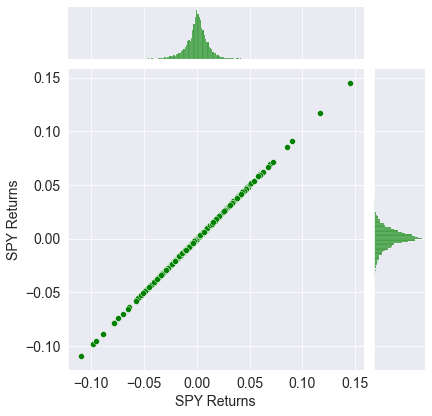

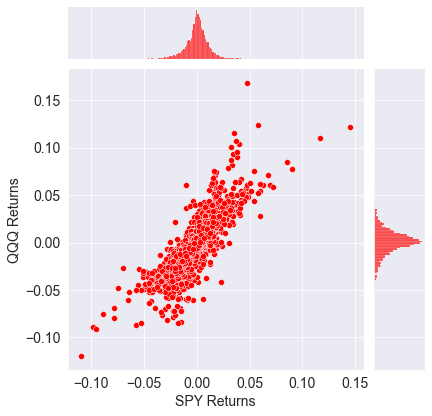

In [45]:
sns.jointplot(data=corr_df,
              x='SPY Returns', 
              y='SPY Returns', 
              kind='scatter',
              color='green')
sns.jointplot(data=corr_df,
              x='SPY Returns', 
              y='QQQ Returns', 
              kind='scatter',
              color='red');


By looking at the red graph we can say that there is HIGH correlation between SPY & QQQ. And we should can apply similar investment strategy for both.

### Q3: Does QQQ Beat SPY? 

We will use the cumulative returns to find this 

In [46]:
#getting rid of first row which has null ruturns 
corr_df = corr_df[1:]
corr_df.sort_index(inplace=True)

In [47]:
corr_df['SPY_cum_ret'] = ((1 + corr_df["SPY Returns"]).cumprod() - 1)*100
corr_df['QQQ_cum_ret'] = ((1 + corr_df["QQQ Returns"]).cumprod() - 1)*100

In [48]:
sp_growth = round(corr_df["SPY_cum_ret"].iloc[-1],2)
QQQ_growth = round(corr_df["QQQ_cum_ret"].iloc[-1],2)
print('SPY Growth is {}% & QQQ Growth is {}%'.format(sp_growth,QQQ_growth))

SPY Growth is 381.25% & QQQ Growth is 596.5%


Lets plot this in a graph

In [49]:
fig = px.line(corr_df[['SPY_cum_ret','QQQ_cum_ret']],
              title='Daily Cumulative Returns'
             )

fig.update_layout(yaxis_title='Daily cumulative returns (%)',
                  xaxis_title='Date',
                  legend_title='Asset Class')

fig.show()

Looks like growth of QQQ is way more than SPY, and it would not be wrong to say that QQQ has Beaten SPY so far in this century.

### Q4: Calculate all Year end to Date Returns 

We will calculate the returns from each year end to the current date.

In [50]:
current_QQQ_price = QQQ_df["adjclose"].iloc[-1]
current_SPY_price = SPY_df["adjclose"].iloc[-1]
print('Current QQQ Price   :{}\nCurrent SPY Price:{}'.format(current_QQQ_price,current_SPY_price))

Current QQQ Price   :307.0899963378906
Current SPY Price:406.6000061035156


In [51]:
#Valid Business year end dates 
year_end_series = pd.date_range(start_date, end_date, freq='BY')

In [52]:
#Create a new data frame which contains only year end dates 
QQQ_ye_df = QQQ_df[QQQ_df.index.isin(year_end_series)].copy()
SPY_ye_df = SPY_df[SPY_df.index.isin(year_end_series)].copy()

In [53]:
QQQ_ye_df['ytd'] = (current_QQQ_price - QQQ_ye_df.adjclose)*100/QQQ_ye_df.adjclose
SPY_ye_df['ytd'] = (current_SPY_price - SPY_ye_df.adjclose)*100/SPY_ye_df.adjclose

In [54]:
ytd_df = pd.merge(QQQ_ye_df, SPY_ye_df, left_index=True, right_index=True, how='inner')[['ytd_x','ytd_y']]
ytd_df.columns = ['QQQ YTD','SPY YTD']

In [56]:
fig = px.bar(ytd_df,
             barmode='group',
             title='Year end to Date Returns',
             color_discrete_sequence=["yellow","cornflowerblue"])
                

fig.update_layout(yaxis_title='Year End to Date Returns', 
                  legend_title='Asset Class')


overall QQQ has outperformed SPY

2020 & 2021 seems to be bad a time for someone to start investing in both assets.

### Q5: Which asset is more Volatile

Volatility is the variation in its price over a period of time, we will calculate **Daily**, **Monthly** & **Annual** volatility.  

**Daily volatility:** The standard deviation of the daily returns. 

**Monthly volatility:** Assuming 21 trading days in the month so we multiply the daily volatility by the square root of 21.

**Annual volatility:** Similarly lets assume 252 trading days in a calendar year and we multiply the daily volatility by the square root of 252.

In [57]:
SPY_std = corr_df['SPY Price'].std()
QQQ_std = corr_df['QQQ Price'].std()
print('Daily volatility of SPY : ',SPY_std)
print('Daily volatility of QQQ : ',QQQ_std)

Daily volatility of SPY :  101.32747085212294
Daily volatility of QQQ :  89.04253734594033


In [58]:
print('Monthly volatility of SPY :',SPY_std*np.sqrt(21))
print('Monthly volatility of QQQ :',QQQ_std*np.sqrt(21))

Monthly volatility of SPY : 464.3408051582849
Monthly volatility of QQQ : 408.04416745870384


In [59]:
print('Annual volatility of SPY :',SPY_std*np.sqrt(252))
print('Annual volatility of QQQ :',QQQ_std*np.sqrt(252))

Annual volatility of SPY : 1608.5237331231804
Annual volatility of QQQ : 1413.5064595412364


Lets try plot Rolling Annual Volatility 

In [60]:
corr_df['SPY_volatility'] = corr_df['SPY Price'].rolling(window=252).std()*np.sqrt(252)
corr_df['QQQ_volatility'] = corr_df['QQQ Price'].rolling(window=252).std()*np.sqrt(252)

In [61]:
fig = px.line(corr_df[['SPY_volatility','QQQ_volatility']],
              title='Rolling Annual Volatility'
             )
                

fig.update_layout(yaxis_title='Annual Volatility', 
                  xaxis_title='Date',
                  legend_title='Asset Class')

fig.show()

Looking at the graph & calculations you can see **SPY** is more volatile than QQQ but at some point QQQ was more volatile.

### Q6: Explain Moving Average 

A "Moving Average" is an indicator which removes the "noise" from a chart by smoothing it. It makes it easier to see a pattern forming over time and helps predict future prices. This is commonly used in technical analysis.

Here I am going to show the Simple Moving Average, Below function will add moving average columns.

In [62]:
def calculate_moving_average(df,period):
    sma_col = 'Simple Moving Average {}'.format(period)
    #ema_col = 'Exponential MA {}'.format(period)
    df[sma_col] = df.adjclose.rolling(period).mean()
    #df[ema_col] = df.adjclose.ewm(span=period, adjust=False).mean()

Lets calculate 1 month & 1 Year moving average 

In [63]:
for data in [QQQ_df, SPY_df]:
    for period in [21,252]:
        calculate_moving_average(data,period)

Plotting Moving Average vs Closing Price.

In [64]:
fig = px.line(SPY_df[['adjclose',
                        'Simple Moving Average 21',
                        'Simple Moving Average 252'
                       ]],
              title='Simple Moving Average for SPY',
              #range_x=['2005-01-01','2015-12-31' ]
              )

fig.update_layout(yaxis_title='Adjusted Closing Price', 
                  xaxis_title='Date', 
                  legend_title='Moving Average', 
                 )

fig.show()

In [65]:
fig = px.line(QQQ_df[['adjclose',
                        'Simple Moving Average 21',
                        'Simple Moving Average 252'
                       ]],
              title='Simple Moving Average for QQQ',
              #range_x=['2005-01-01','2015-12-31' ]
              )

fig.update_layout(yaxis_title='Adjusted Closing Price', 
                  xaxis_title='Date', 
                  legend_title='Moving Average', 
                 )

fig.show()

The moving average helps to level the price data over a specified period by creating a constantly updated average price.

### Q7: How to Normalize prices

If we want to compare multiple time series/stock price trends then Normalizing data would be beneficial. After normalization the price will be ranging in an interval between 0 and 1. 

Lets check how it is done.

In [66]:
def min_max_scaling(series):
    return (series - series.min()) / (series.max() - series.min())

In [67]:
QQQ_df['close_normalize'] = min_max_scaling(QQQ_df.adjclose)
SPY_df['close_normalize'] = min_max_scaling(SPY_df.adjclose)
all_df = pd.concat([SPY_df,QQQ_df])

In [69]:
fig = px.line(all_df,
              x=all_df.index,
              y=all_df.close_normalize,
              color=all_df.asset_class, 
              color_discrete_sequence=["violet", "yellow"],
              template = 'plotly_dark',
              title='Normalized Closing Price Trend')

fig.update_layout(xaxis_title='Date', 
                  yaxis_title='Closing Price', 
                  legend_title='Asset Class')

fig.show();

Normalization is convenient for comparing price trends for multiple stocks in one graph. Normalizing time series is also good as preprocessing technique for predictions via neural networks.

### Q8: When the QQQ Prices were higher than SPY

Mathematically its very easy to find the price differences, but if we plot the same information on the graph it became very intuitive.

Lets plot graph of closing prices long with the difference in prices.

In [70]:
#adding a new column 
corr_df['diff'] = corr_df['SPY Price']-corr_df['QQQ Price']

In [76]:
trace0 = go.Scatter(
                    x=corr_df.index, 
                    y=corr_df['SPY Price'], 
                    name='SPY', 
                    line=dict(color='lime')
                   )

trace1 = go.Scatter(
                    x=corr_df.index, 
                    y=corr_df['QQQ Price'], 
                    name='QQQ', 
                    line=dict(color='grey')
                   )

trace2 = go.Scatter(
                    x=corr_df.index, 
                    y=corr_df['diff'], 
                    name='Difference', 
                    line=dict(color='red')
                   )

data = [trace0, trace1, trace2]
layout = {
    'title': 'Stock Prices of SPY vs QQQ',
    'yaxis': {'title': 'price'},
    'shapes': [{
        'x0': '2000-03-01', 'x1': '2000-03-01',
        'y0': 0, 'y1': 1, 'yref': 'paper',
        'line': {'color': 'red', 'width': 1}
    }    
    ],
    'annotations': [{
        'x': '2000-03-29',  'yref': 'paper',
         'showarrow': False, 'xanchor': 'left',
        'text': 'QQQ > SPY'
    }
    ]
}

fig = dict(data=data, layout=layout)
py.iplot(fig)

Its very easier to find the insights of the data via visualization, you can clearly see the QQQ prices were higher from 2009 to Apr 2013.

## Inferences

From above exploratory data analysis I have drawn many inference and here's a brief summary. *(This summary is prepared based on the data captured on 2022-09-10)*

##TODO - add your Inferences

## Future Work
Ideas for future work
* You can perform similar EDA to Crypto currency or any Individual stock.
* You can try to predict future prices using this EDA and applying different Machine learning models.



## References

References to some useful links.<br>

- https://github.com/vinodvidhole/QQQ_vs_SPY_eda_project
- https://medium.com/@vinodvidhole 
- https://finance.yahoo.com/
- https://pypi.org/project/yahoofinancials/
- https://www.quantconnect.com/tutorials/introduction-to-financial-python/rate-of-return,-mean-and-variance
- https://www.investopedia.com/terms/m/movingaverage.asp
- https://machinelearningmastery.com/normalize-standardize-time-series-data-python/